In [2]:
%matplotlib inline

In [3]:
import sklearn  # Solves a bug with failed TLS import https://github.com/scikit-learn/scikit-learn/issues/14485
                # Simply importing sklearn seems to help

In [4]:
import torch

In [5]:
import argparse
import datetime
import yaml
import os
import tqdm
from collections import OrderedDict
import itertools

import plotly.express as px
import plotly.graph_objects as go

import torch
from torch import distributions
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt

import cma
from scipy.optimize import fmin_l_bfgs_b

from data.datasets_pointflow import CIFDatasetDecorator, ShapeNet15kPointClouds
from utils.losses import loss_fun, loss_fun_ret
# try:
#     from utils.MDS import multiDS
# except:
#     print("MDS failed to load")
from utils.MDS import multiDS

from models.models import model_init, model_load
from models.flows import F_flow_new, G_flow_new, F_flow, G_flow
from experiments.test.metrics_eval import metrics_eval

from utils.plotting_tools import plot_points

Structural losses failed to load


In [6]:
def plot_cloud(points):  
    try:
        points = points.detach().cpu().numpy()
    except:
        pass
    fig = go.Figure([
        go.Scatter3d(
            x=points[:, 0], 
            y=points[:, 1], 
            z=points[:, 2],
            marker=dict(size=3, color=points[:, 2]),
            mode='markers',
        )])
    axis=dict(range=[points.min(), points.max()])
    fig.update_layout(
        scene=dict(
            camera=dict(
                up=dict(x=0, y=1., z=0),
                eye=dict(x=3, y=1, z=-9),
                projection=dict(type="orthographic")),
            # aspectmode='cube',
            xaxis=dict(range=[points[:,0].min(), points[:,0].max()]),
            yaxis=dict(range=[points[:,1].min(), points[:,1].max()]),
            zaxis=dict(range=[points[:,2].min(), points[:,2].max()]),
            aspectmode='manual',
            aspectratio=dict(x=points[:,0].max()-points[:,0].min(),
                             y=points[:,1].max()-points[:,1].min(),
                             z=points[:,2].max()-points[:,2].min(),
                            ),
        ),
#         width=1600,
#         height=400
    )
    return fig

In [7]:
config = yaml.full_load(open('configs/cif_frodo.yaml'))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
assert not config['use_new_g']
assert not config['use_new_f']

In [9]:
F_flows, G_flows, optimizer, scheduler = model_load(config, device)
for _flow in itertools.chain(G_flows.values(), F_flows.values()):
    for p in _flow.parameters():
        p.requires_grad = False

prior_z = distributions.MultivariateNormal(torch.zeros(3), torch.eye(3)) # * config['prior_z_var'])

In [23]:
def rot_matrix(rot):
    rot = torch.tensor(rot, dtype=torch.float)
    x, y, z = rot
    kwargs=dict(dtype=torch.float32, device=device)
    rx = (
        torch.tensor([
            [ 1.0,  0.0,  0.0],
            [ 0.0,  0.0,  0.0],
            [ 0.0,  0.0,  0.0]], **kwargs) + 
        torch.tensor([
            [ 0.0,  0.0,  0.0],
            [ 0.0,  1.0,  0.0],
            [ 0.0,  0.0,  1.0]], **kwargs) * torch.cos(x) + 
        torch.tensor([
            [ 0.0,  0.0,  0.0],
            [ 0.0,  0.0, -1.0],
            [ 0.0,  1.0,  0.0]], **kwargs) * torch.sin(x)
    )
    ry = (
        torch.tensor([
            [ 0.0,  0.0,  0.0],
            [ 0.0,  1.0,  0.0],
            [ 0.0,  0.0,  0.0]], **kwargs) + 
        torch.tensor([
            [ 1.0,  0.0,  0.0],
            [ 0.0,  0.0,  0.0],
            [ 0.0,  0.0,  1.0]], **kwargs) * torch.cos(y) + 
        torch.tensor([
            [ 0.0,  0.0,  1.0],
            [ 0.0,  0.0,  0.0],
            [-1.0,  0.0,  0.0]], **kwargs) * torch.sin(y)
    )
    rz = (
        torch.tensor([
            [ 0.0,  0.0,  0.0],
            [ 0.0,  0.0,  0.0],
            [ 0.0,  0.0,  1.0]], **kwargs) + 
        torch.tensor([
            [ 1.0,  0.0,  0.0],
            [ 0.0,  1.0,  0.0],
            [ 0.0,  0.0,  0.0]], **kwargs) * torch.cos(z) + 
        torch.tensor([
            [ 0.0, -1.0,  0.0],
            [ 1.0,  0.0,  0.0],
            [ 0.0,  0.0,  0.0]], **kwargs) * torch.sin(z)
    )
    r = rx @ ry @ rz
    return r


def scale_matrix(scales):
    return torch.diag(torch.tensor(scales, dtype=torch.float, device=device))

def transform(points, rot=(0.0, 0.0, 0.0), scales=(1.0, 1.0, 1.0)):
    rot_mat = rot_matrix(rot)
    scale_mat = scale_matrix(scales)
    mat = rot_mat @ scale_mat
    return points @ mat

In [11]:
cloud_pointflow = ShapeNet15kPointClouds(
        tr_sample_size=1e10,
        te_sample_size=1e10,
        root_dir=config["root_dir"],
        root_embs_dir=config["root_embs_dir"],
        normalize_per_shape=config["normalize_per_shape"],
        normalize_std_per_axis=config["normalize_std_per_axis"],
        split="train",
        scale=config["scale"],
        categories=config["categories"],
        random_subsample=True,
    )

Total number of data:2832


In [12]:
config['categories']

['airplane']

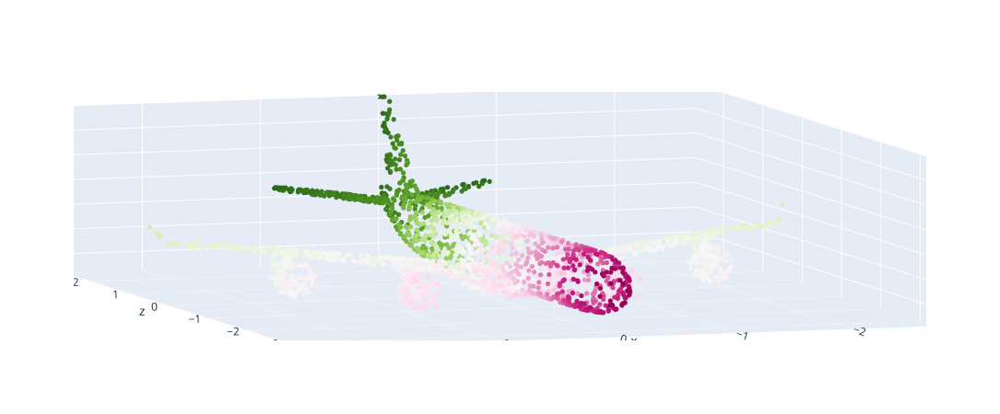

In [78]:
K = 16
datum = cloud_pointflow[K]
train_points = datum['train_points'].to(device)[:3000]
w_iter = datum["w"].view(1,-1).to(device)

plot_cloud(train_points)

In [19]:
e, e_ldetJ = G_flow(w_iter, G_flows, config['n_flows_G'], config['emb_dim'])

# note: this captures the cloud embedding!
def loss(x, e=e):
    e_per_point = e.expand(x.shape[0], e.shape[1])
    z, z_ldetJ = F_flow(x, e_per_point, F_flows, config['n_flows_F'])
    return loss_fun_ret(z, z_ldetJ, prior_z)

loss(train_points)

tensor(-1.4396, device='cuda:0')

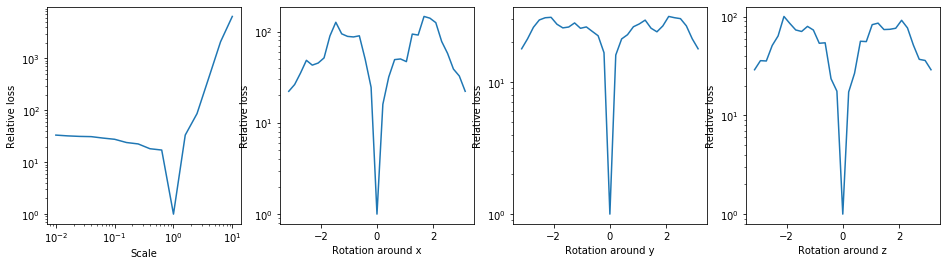

In [21]:
def get_transform_losses(e):
    losses = []
    scales = np.logspace(-2, 1, 16)
    for scale in scales:
        losses.append(
            loss(train_points * scale, e=e
                ).item() - 3 * np.log(scale))
    scale_losses = np.array([scales, losses, 
                             # Sometimes the loss is negatve, shift up
                             np.array(losses) + 1.0 - min(losses) ])    
    
    rot_losses = {}
    for idx, axis in enumerate('xyz'):
        losses = []
        rots = np.linspace(-np.pi, np.pi, 31)
        for rot in rots:
            rot_vec = [0.0, 0.0, 0.0]
            rot_vec[idx] = rot
            losses.append(
                loss(train_points @ rot_matrix(rot_vec), e=e
                    ).item())
        rot_losses[axis] = np.array([rots, losses, 
                                     # Sometimes the loss is negatve, shift up
                                     np.array(losses) + 1.0 - min(losses) ])    
    return scale_losses, rot_losses

scale_losses, rot_losses = get_transform_losses(e=e)

plt.figure(figsize=(16, 4))
plt.title('Pose recovery using cloud\'s embedding vector')
plt.subplot(1,4,1)
plt.loglog(scale_losses[0], scale_losses[2])
plt.xlabel('Scale')
plt.ylabel('Relative loss')

for i, (axis, losses) in enumerate(rot_losses.items()):
    plt.subplot(1, 4, 2+i)
    plt.semilogy(losses[0], losses[2])
    plt.xlabel(f'Rotation around {axis}')
    plt.ylabel('Relative loss')

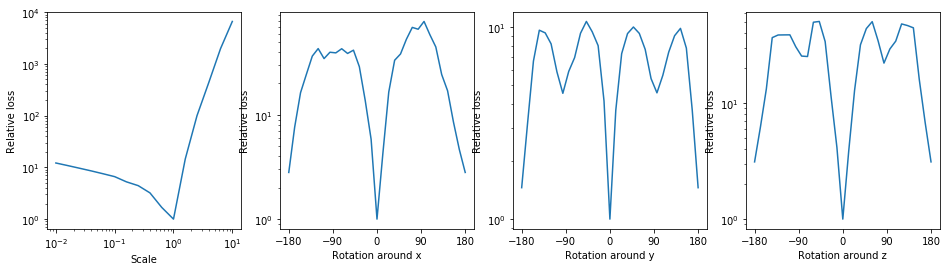

In [22]:
scale_losses, rot_losses = get_transform_losses(e=torch.zeros_like(e))

plt.figure(figsize=(16, 4))
plt.title('Pose recovery using null embedding vector')
plt.subplot(1,4,1)
plt.loglog(scale_losses[0], scale_losses[2])
plt.xlabel('Scale')
plt.ylabel('Relative loss')

for i, (axis, losses) in enumerate(rot_losses.items()):
    plt.subplot(1, 4, 2+i)
    plt.semilogy(losses[0] / np.pi * 180, losses[2])
    plt.xlabel(f'Rotation around {axis}')
    plt.ylabel('Relative loss')
    plt.xticks([-180, -90, 0, 90, 180])

In [82]:
class OptBase:
    @classmethod
    def f(cls, x, points, e):
        trans_mat = cls.trans_mat(x)
        trans_points = points @ trans_mat
        ll = loss(trans_points, e) - torch.slogdet(trans_mat)[1]
        return ll.item()
    
    @classmethod
    def transform(cls, points, x):
        trans_mat = cls.trans_mat(x)
        trans_points = points @ trans_mat
        return trans_points

class OptRot(OptBase):
    @classmethod
    def x0(cls):
        return [0.0] * 3
    
    @classmethod
    def trans_mat(cls, x):
        return rot_matrix(x)


class OptUnsignedScale(OptBase):
    @classmethod
    def x0(cls):
        return [0.0] * 3
    
    @classmethod
    def trans_mat(cls, x):
        return scale_matrix(np.exp(x))

    
class OptScale(OptBase):
    @classmethod
    def x0(cls):
        return [1.0] * 3
    
    @classmethod
    def trans_mat(cls, x):
        return scale_matrix(x)


class OptMat(OptBase):
    @classmethod
    def x0(cls):
        return np.eye(3).reshape(-1)
    
    @classmethod
    def trans_mat(cls, x):
        return torch.tensor(x, dtype=torch.float, device='cuda').view(3, 3)


# These work:

# opt = OptRot()
# trans_mat = opt.trans_mat([np.pi/3, -1.0, 0.1])
# mutated_points = train_points @ trans_mat
# opt_e = e

# opt = OptUnsignedScale()
# trans_mat = opt.trans_mat([2.0, 0.5, 0.1])
# mutated_points = train_points @ trans_mat
# opt_e = e

# opt = OptMat()
# trans_mat = rot_matrix([np.pi/3, -1.0, 0.1]) @ scale_matrix([0.1, 0.5, 1.5])
# mutated_points = train_points @ trans_mat
# opt_e = e

opt = OptMat()
trans_mat = rot_matrix([np.pi/3, -1.0, 0.1]) @ scale_matrix([0.1, -0.5, 1.5])
mutated_points = train_points @ trans_mat
opt_e = e


print('loss at default pose', opt.f(opt.x0(), train_points, opt_e))
i_trans_mat = torch.inverse(trans_mat)
print('loss for inverse transform',
      loss(mutated_points @ i_trans_mat, e) - torch.slogdet(i_trans_mat)[1])

means = []
opts = cma.CMAOptions()
opts.set('tolfun', 1e-2)
ret = cma.fmin(opt.f, opt.x0(), 0.5, 
               options=opts, args=(mutated_points, opt_e),
               callback=lambda x: means.append(np.array(x.mean)))
print('ret', ret[0], ret[1])

loss at default pose -1.470704197883606
loss for inverse transform tensor(-4.0610, device='cuda:0')
(5_w,10)-aCMA-ES (mu_w=3.2,w_1=45%) in dimension 9 (seed=620163, Tue May 26 16:57:47 2020)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     10 2.129658317565918e+01 1.0e+00 4.83e-01  5e-01  5e-01 0:03.2
    2     20 2.152706146240234e+01 1.2e+00 4.84e-01  4e-01  5e-01 0:06.4
    3     30 2.642900657653809e+01 1.3e+00 5.01e-01  5e-01  5e-01 0:09.6
    4     40 1.831495285034180e+01 1.4e+00 4.84e-01  4e-01  5e-01 0:12.8
    6     60 1.759371566772461e+01 1.6e+00 4.30e-01  4e-01  5e-01 0:19.2
    8     80 1.643352699279785e+01 1.7e+00 4.03e-01  3e-01  5e-01 0:25.8
   10    100 1.518548107147217e+01 1.8e+00 3.88e-01  3e-01  4e-01 0:33.0
   12    120 1.465208148956299e+01 2.0e+00 3.38e-01  2e-01  4e-01 0:40.1
   15    150 1.541656684875488e+01 2.5e+00 3.32e-01  2e-01  4e-01 0:50.9
   18    180 1.574047470092773e+01 2.7e+00 3.44e-01  2e-01  4e-01 1:01.7
   21  

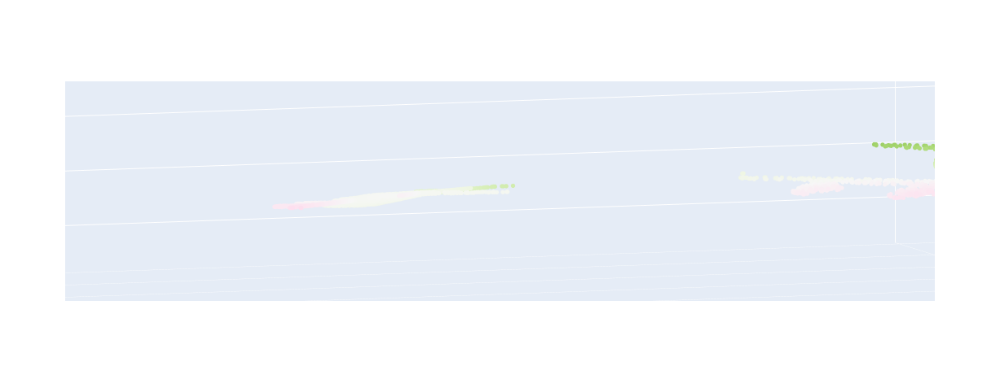

In [85]:
train_points_np = train_points.detach().cpu().numpy()

clouds = [
    opt.transform(mutated_points, means[i]).detach().cpu().numpy()
    for i in np.round(2**np.linspace(0, np.log2(len(means)), 8)).astype('int32') - 1  # np.linspace(0, len(means)-1, 8, dtype='int32')
]

clouds_shift = [
    c + [[-6 * i, 0, 0]]
    for i, c in enumerate(clouds)
]

clouds_shift.append(train_points_np + [[-6 * len(clouds_shift), 0, 0]])

plot_cloud(np.vstack(clouds_shift))

In [91]:
opt = OptMat()
trans_mat = rot_matrix([np.pi/3, -1.0, 0.1]) @ scale_matrix([0.1, 0.5, 1.5])
mutated_points = train_points @ trans_mat
opt_e = torch.zeros_like(e)


print('loss at default pose', opt.f(opt.x0(), train_points, opt_e))
i_trans_mat = torch.inverse(trans_mat)
print('loss for inverse transform',
      loss(mutated_points @ i_trans_mat, opt_e) - torch.slogdet(i_trans_mat)[1])

means = []
opts = cma.CMAOptions()
opts.set('tolfun', 1e-2)
ret = cma.fmin(opt.f, opt.x0(), 0.5, 
               options=opts, args=(mutated_points, opt_e),
               callback=lambda x: means.append(np.array(x.mean)))
print('ret', ret[0], ret[1])

loss at default pose 6.118134498596191
loss for inverse transform tensor(3.5279, device='cuda:0')
(5_w,10)-aCMA-ES (mu_w=3.2,w_1=45%) in dimension 9 (seed=596582, Tue May 26 17:37:34 2020)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     10 2.595762252807617e+01 1.0e+00 4.15e-01  4e-01  4e-01 0:03.2
    2     20 1.730156135559082e+01 1.1e+00 4.14e-01  4e-01  4e-01 0:06.4
    3     30 1.553571701049805e+01 1.3e+00 3.90e-01  3e-01  4e-01 0:09.6
    4     40 1.354184055328369e+01 1.3e+00 3.74e-01  3e-01  4e-01 0:12.8
    6     60 8.553943634033203e+00 1.4e+00 3.71e-01  3e-01  4e-01 0:19.2
    8     80 6.956005573272705e+00 1.6e+00 4.01e-01  3e-01  4e-01 0:26.1
   10    100 7.912240505218506e+00 1.9e+00 4.34e-01  3e-01  5e-01 0:33.2
   12    120 9.940361022949219e+00 2.0e+00 4.66e-01  3e-01  6e-01 0:40.4
   15    150 9.937272071838379e+00 2.4e+00 4.90e-01  3e-01  6e-01 0:51.2
   18    180 5.740061759948730e+00 2.7e+00 4.26e-01  2e-01  5e-01 1:01.9
   21    

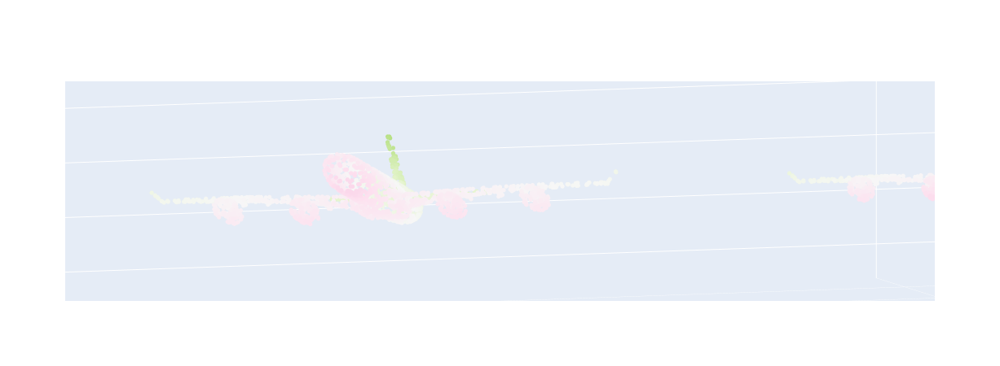

In [92]:
train_points_np = train_points.detach().cpu().numpy()

clouds = [
    opt.transform(mutated_points, means[i]).detach().cpu().numpy()
    # for i in np.round(2**np.linspace(0, np.log2(len(means)), 8)).astype('int32') - 1  
    for i in np.linspace(0, len(means)-1, 8, dtype='int32')
]

clouds_shift = [
    c + [[-6 * i, 0, 0]]
    for i, c in enumerate(clouds)
]

clouds_shift.append(train_points_np + [[-6 * len(clouds_shift), 0, 0]])

plot_cloud(np.vstack(clouds_shift))

In [ ]:
# Gradient-based falls into local minima...
mutated_points = (
    train_points @ diff_rot_matrix(torch.tensor(np.pi/3), 
                                   torch.tensor(0.0), 
                                   torch.tensor(0.0)).T
)

def opt_fun(point):
    x, y, z = point
    x = torch.tensor(x, device='cuda').requires_grad_(True)
    y = torch.tensor(y, device='cuda').requires_grad_(True)
    z = torch.tensor(z, device='cuda').requires_grad_(True)

    mm = diff_rot_matrix(x, y, z)

    ll = loss(mutated_points @ mm.T)
    ll.backward()
    return ll.item(), np.array([x.grad.item(),
                                y.grad.item(),
                                z.grad.item() ])


ret = fmin_l_bfgs_b(opt_fun, [0.0, 0.0, 0.0], bounds=[(-np.pi, np.pi)] * 3, iprint=1)
print('ret', ret[0], ret[1])